In [1]:
%%capture --no-stdout
%reload_ext watermark
%watermark -uniz --author "Prayson W. Daniel" -vm -p ollama

Author: Prayson W. Daniel

Last updated: 2024-11-19T20:41:23.461748+01:00

Python implementation: CPython
Python version       : 3.11.10
IPython version      : 8.29.0

ollama: 0.3.3

Compiler    : Clang 15.0.0 (clang-1500.3.9.4)
OS          : Darwin
Release     : 23.5.0
Machine     : arm64
Processor   : arm
CPU cores   : 16
Architecture: 64bit



# Book Recommendation from Image

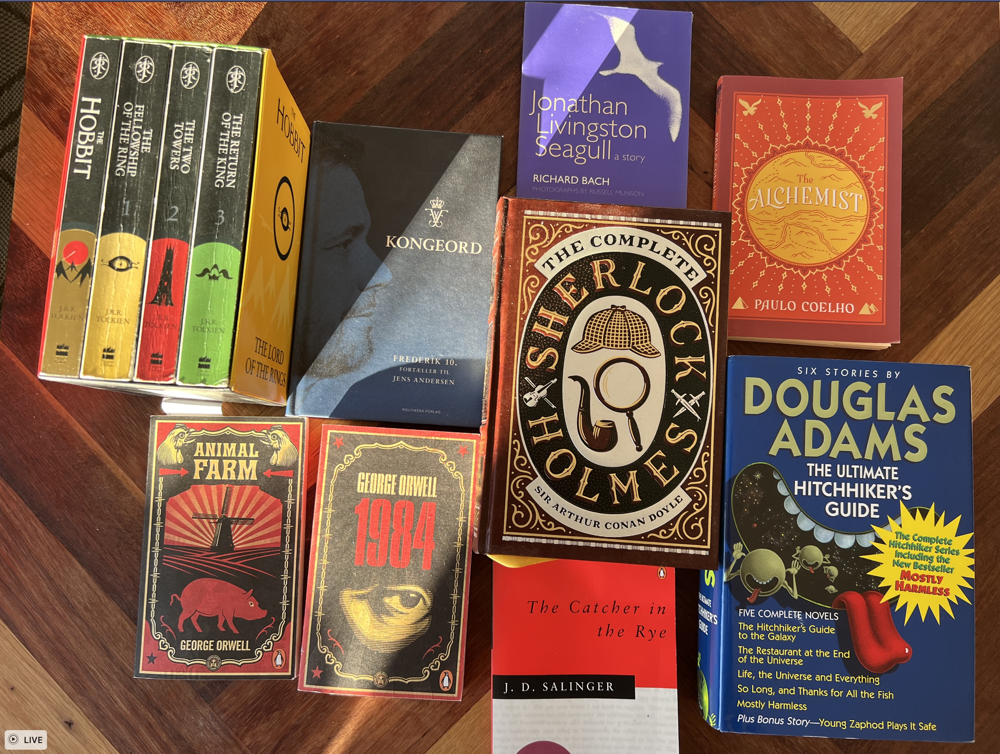

In [2]:
from IPython.display import display_markdown
import ollama

In [3]:
# stochastic without seed
prompt = 'What is in this image?'

response = ollama.chat(
    model='llama3.2-vision',
    messages=[{
        'role': 'user',
        'content': prompt,
        'images': ['../data/images/books.png']
    }]
)

display_markdown(response["message"]["content"], raw=True)

The image displays a collection of 12 books arranged on a wooden surface. The books are placed in three rows, with four books in the top row, four in the middle row, and four in the bottom row.

Here is a list of the books shown:

* Top Row:
	+ **The Hobbit** by J.R.R. Tolkien
	+ **The Fellowship of the Ring** by J.R.R. Tolkien
	+ **The Two Towers** by J.R.R. Tolkien
	+ **The Return of the King** by J.R.R. Tolkien (book 3 in The Lord of the Rings series)
* Middle Row:
	+ **Kongeord** by Frederik Stjernfelt
	+ **Sherlock Holmes: The Complete Stories** by Sir Arthur Conan Doyle
	+ **Jonathan Livingston Seagull** by Richard Bach
	+ **The Alchemist** by Paulo Coelho
* Bottom Row:
	+ **Animal Farm** by George Orwell
	+ **1984** by George Orwell
	+ **The Catcher in the Rye** by J.D. Salinger
	+ **The Hitchhiker's Guide to the Galaxy** by Douglas Adams

It appears that this is a collection of classic and popular literature, featuring works from various genres such as fantasy, science fiction, mystery, and philosophy.

In [4]:
# taming stochastic nature seed

client = ollama.Client(host="http://localhost:11434")

output = client.chat(
      
     model='llama3.2-vision',
     messages=[{
        'role': 'user',
        'content': prompt,
        'images': ['../data/images/books.png']
     }],
      options={  
                "seed": 42,
                "temperature": 0.0, 
                "num_ctx": 2048 # must be set for reproducibility
            }
    )
    
display_markdown(output["message"]["content"], raw=True)

This image shows a collection of books arranged on a wooden surface. The books are placed in two rows, with some lying flat and others standing upright. The books include:

* "The Hobbit" by J.R.R. Tolkien
* "The Lord of the Rings" trilogy by J.R.R. Tolkien
* "Kongeord" (a Danish novel)
* "Seagull" (a play by Anton Chekhov)
* "The Alchemist" by Paulo Coelho
* "Animal Farm" by George Orwell
* "1984" by George Orwell
* "The Catcher in the Rye" by J.D. Salinger
* "Sherlock Holmes: The Complete Stories" by Sir Arthur Conan Doyle
* "The Hitchhiker's Guide to the Galaxy" series by Douglas Adams
* "Jonathan Livingston Seagull" (a novella by Richard Bach)

Overall, this image appears to be a collection of classic literature and popular fiction, with a mix of fantasy, science fiction, and literary works.

In [7]:
query = """
 You are a brilliant Librarian. 
 First list the books in image  and then
 recommend 10 other books based on the list from image, user might enjoy 

"""

recommendation = client.chat(
      
     model='llama3.2-vision',
     messages=[{
        'role': 'user',
        'content': query,
        'images': ['../data/images/books.png']
     }],
      options={  
                "seed": 7,
                "temperature": 0.0, 
                "num_ctx": 2048 # must be set for reproducibility
            }
    )
 



display_markdown(recommendation["message"]["content"], raw=True)

What a delightful collection of books!

Here is the list of books in the image:

1. The Hobbit by J.R.R. Tolkien
2. The Fellowship of the Ring by J.R.R. Tolkien
3. The Two Towers by J.R.R. Tolkien
4. The Return of the King by J.R.R. Tolkien (not visible, but part of the set)
5. Kongeord by Frederik Stjernfelt
6. Jonathan Livingston Seagull by Richard Bach
7. The Alchemist by Paulo Coelho
8. Animal Farm by George Orwell
9. 1984 by George Orwell
10. Sherlock Holmes: The Complete Novels and Stories by Sir Arthur Conan Doyle
11. Catcher in the Rye by J.D. Salinger
12. Hitchhiker's Guide to the Galaxy by Douglas Adams

Now, based on this list, here are 10 book recommendations that might interest you:

1. **The Name of the Rose** by Umberto Eco - A historical mystery novel with philosophical undertones, similar to George Orwell's works.
2. **The Little Prince** by Antoine de Saint-Exupéry - A classic tale of self-discovery and adventure, reminiscent of Richard Bach's Jonathan Livingston Seagull.
3. **The Count of Monte Cristo** by Alexandre Dumas - A classic adventure novel with themes of redemption and justice, similar to J.R.R. Tolkien's works.
4. **The Handmaid's Tale** by Margaret Atwood - A dystopian novel exploring themes of oppression and resistance, similar to George Orwell's 1984.
5. **The Shadow of the Wind** by Carlos Ruiz Zafón - A gothic mystery novel with a focus on literature and storytelling, similar to Douglas Adams' Hitchhiker's Guide to the Galaxy.
6. **The Night Circus** by Erin Morgenstern - A magical realist novel with a focus on imagination and wonder, similar to J.R.R. Tolkien's works.
7. **The Giver** by Lois Lowry - A dystopian novel exploring themes of conformity and individuality, similar to George Orwell's 1984.
8. **The Golden Compass** by Philip Pullman - A fantasy adventure novel with a focus on alternate worlds and philosophical themes, similar to J.R.R. Tolkien's works.
9. **The House of the Spirits** by Isabel Allende - A magical realist novel exploring themes of family, love, and social change, similar